In [88]:
import pandas as pd
import numpy as np
import altair as alt
import plotly.express as px
import scipy.stats as ss
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
data =  pd.read_csv('zoo.data')

In [6]:
zoo_name = ['animal name','hair','feathers','eggs','milk','airborne','aquatic','predator','toothed','backbone','breathes','venomous','fins','legs','tail','domestic',' cat-size','type']

In [7]:
data.columns = zoo_name

### Libreria especializada para visualización
En vectores, la libreria altair, perfecta para exploración de datos y preprocesamientos

In [11]:
alt.Chart(data).mark_line().encode(
    x = 'animal name',
    y = 'legs'
)

alt.Chart(...)

In [12]:
alt.Chart(data).mark_bar().encode(
    x = 'animal name',
    y = 'legs'
)

alt.Chart(...)

### Visualización rapida con calculos
Te ayuda con calculos la libreria plotly y es bastante dinamica

In [14]:
px.pie(data,values='aquatic',names='animal name',title='Grafica de pie')

### Otras librerias
Esta seaborn matplotlib y bokeh
Bokeh sirve bastante para el desarrollo de mapas y colocarla por su dinamismo en producción de dashboards

## Transformación de los datos

In [15]:
data = pd.read_csv('Traffic_Crashes1.csv')

In [20]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27961 entries, 0 to 27960
Data columns (total 51 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   Unnamed: 0                     27961 non-null  int64              
 1   CRASH_RECORD_ID                27961 non-null  object             
 2   RD_NO                          27713 non-null  object             
 3   CRASH_DATE_EST_I               2117 non-null   object             
 4   CRASH_DATE                     27961 non-null  datetime64[ns, UTC]
 5   POSTED_SPEED_LIMIT             27961 non-null  int64              
 6   TRAFFIC_CONTROL_DEVICE         27961 non-null  object             
 7   DEVICE_CONDITION               27961 non-null  object             
 8   WEATHER_CONDITION              27961 non-null  object             
 9   LIGHTING_CONDITION             27961 non-null  object             
 10  FIRST_CRASH_TYPE      

In [19]:
data['CRASH_DATE'] = data['CRASH_DATE'].apply(lambda x:pd.to_datetime(x,errors='coerce',utc=True))

In [22]:
data['NUM_UNITS'] = data['NUM_UNITS'].astype('int32')

In [23]:
token_map_plot = 'pk.eyJ1IjoiZmFiaWFubHVlbmdhcyIsImEiOiJja3d0bnR0a3QwcnZxMnVteWNhdzVlOGVyIn0.eKhkPiGrPUvFYx76gX50NA'

In [24]:
px.set_mapbox_access_token(token_map_plot)

In [26]:
px.scatter_mapbox(data,lat='LATITUDE',lon='LONGITUDE',color='CRASH_HOUR',size='NUM_UNITS',color_continuous_scale=px.colors.cyclical.IceFire,size_max=15,)

### Estadistica descriptiva

In [27]:
data['lat_round'] = round(data['LATITUDE'],2)
data['long_round'] = round(data['LONGITUDE'],2)

In [28]:
px.scatter_mapbox(data,lat='lat_round',lon='long_round',color='CRASH_HOUR',
                  size='NUM_UNITS',color_continuous_scale=px.colors.cyclical.IceFire,
                  size_max=15,)

### ¿Que historia deseo contar con los datos?
Para quien es el estudio
determinar las variables
#### Analisis estadistico

<AxesSubplot:>

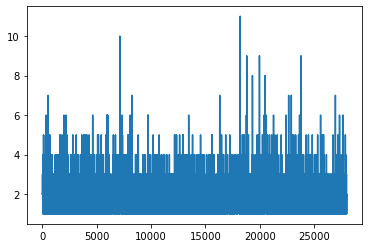

In [29]:
data['NUM_UNITS'].plot()

In [36]:
data['NUM_UNITS'].astype('float32')

0        2.0
1        2.0
2        2.0
3        2.0
4        2.0
        ... 
27956    1.0
27957    2.0
27958    2.0
27959    2.0
27960    2.0
Name: NUM_UNITS, Length: 27961, dtype: float32

In [37]:
## Desviación estandar y coeficiente de variación
ss.tstd(data['NUM_UNITS']),ss.variation(data['NUM_UNITS'])

(0.44297544582405907, 0.21794501057510543)

#### Distribución
¿Cómo aproximar una distribución?

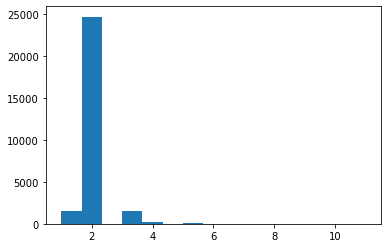

In [45]:
plt.hist(data['NUM_UNITS'],bins=15)
plt.show()

In [47]:
tab=pd.crosstab(index=data['CRASH_MONTH'],columns='Frecuencia')

<BarContainer object of 12 artists>

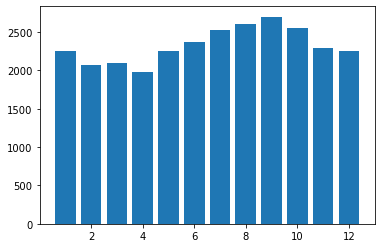

In [48]:
plt.bar(tab.index,tab['Frecuencia'])

- Ajuste de curva: ajustar tu curva para poder tratar tus datos

### Groupby para responder preguntas

In [54]:
report_1 = data.groupby(['LIGHTING_CONDITION','REPORT_TYPE','CRASH_HOUR']).agg({'NUM_UNITS':['sum','min','max']})

In [55]:
report_1.reset_index(inplace=True)

In [56]:
report_1

LIGHTING_CONDITION                 REPORT_TYPE CRASH_HOUR NUM_UNITS      \
                                                                    sum min   
0             DARKNESS                     AMENDED         20         2   2   
1             DARKNESS  NOT ON SCENE (DESK REPORT)          0        97   1   
2             DARKNESS  NOT ON SCENE (DESK REPORT)          1        86   1   
3             DARKNESS  NOT ON SCENE (DESK REPORT)          2        64   1   
4             DARKNESS  NOT ON SCENE (DESK REPORT)          3        57   1   
..                 ...                         ...        ...       ...  ..   
286            UNKNOWN                    ON SCENE         19         9   1   
287            UNKNOWN                    ON SCENE         20        10   2   
288            UNKNOWN                    ON SCENE         21        10   2   
289            UNKNOWN                    ON SCENE         22        20   2   
290            UNKNOWN                    ON SCENE         23         6   2   

         
    max  
0     2  
1     2  
2     2  
3     5  
4     2  
..   ..  
286   2  
287   2  
288   2  
289   3  
290   2  

[291 rows x 6 columns]

In [53]:
alt.Chart(report_1).mark_bar().encode(
    x='LIGHTING_CONDITION',
    y='NUM_UNITS',
    color = 'REPORT_TYPE'
    ).properties(width=220)

alt.Chart(...)

### Integración de datos

In [59]:
df_red = pd.read_csv('winequality-red.csv',delimiter=';')
df_white = pd.read_csv('winequality-white.csv',delimiter=';') 

In [61]:
df_red.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [62]:
df_white.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [66]:
df_red['color'] = 'red'
df_white['color'] = 'white'

In [67]:
df_red.append(df_white)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,color
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,red
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,white
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,white
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,white
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,white


In [200]:
df = pd.concat([df_white,df_red])

### Tipos de uniones

In [72]:
right = pd.DataFrame({'key':['key1','key2','key3'],'A':['a1','a2','a3']})

In [73]:
left = pd.DataFrame({'key':['key3','key4','key5'],'A':['b1','b2','b3']})

Trae todo de la izquierda y luego lo convina con los datos existentes en la derecha

In [74]:
pd.merge(right,left,on='key',how='left')

,key,A_x,A_y
0,key1,a1,NaN
1,key2,a2,NaN
2,key3,a3,b1


### Tablas Pivot
Sirve para hacer un pivot con todos los datos del data set sin necesidad de especificarlo

In [76]:
pd.pivot_table(data,index=['LIGHTING_CONDITION','REPORT_TYPE'])

BEAT_OF_OCCURRENCE  \
LIGHTING_CONDITION     REPORT_TYPE                                      
DARKNESS               AMENDED                            1614.000000   
                       NOT ON SCENE (DESK REPORT)         1183.079090   
                       ON SCENE                           1166.488235   
DARKNESS, LIGHTED ROAD AMENDED                             922.666667   
                       NOT ON SCENE (DESK REPORT)         1298.297699   
                       ON SCENE                           1223.077152   
DAWN                   NOT ON SCENE (DESK REPORT)         1137.302789   
                       ON SCENE                           1183.760181   
DAYLIGHT               AMENDED                            1261.692308   
                       NOT ON SCENE (DESK REPORT)         1263.180461   
                       ON SCENE                           1228.757692   
DUSK                   AMENDED                             321.500000   
                       NOT ON SCENE (DESK REPORT)         1252.676892   
                       ON SCENE                           1223.255319   
UNKNOWN                NOT ON SCENE (DESK REPORT)         1410.566406   
                       ON SCENE                           1258.668394   

                                                   CRASH_DAY_OF_WEEK  \
LIGHTING_CONDITION     REPORT_TYPE                                     
DARKNESS               AMENDED                              5.000000   
                       NOT ON SCENE (DESK REPORT)           4.100758   
                       ON SCENE                             4.200000   
DARKNESS, LIGHTED ROAD AMENDED                              6.333333   
                       NOT ON SCENE (DESK REPORT)           4.208612   
                       ON SCENE                             4.061258   
DAWN                   NOT ON SCENE (DESK REPORT)           4.047809   
                       ON SCENE                             4.049774   
DAYLIGHT               AMENDED                              4.307692   
                       NOT ON SCENE (DESK REPORT)           4.127474   
                       ON SCENE                             4.129142   
DUSK                   AMENDED                              3.500000   
                       NOT ON SCENE (DESK REPORT)           4.034765   
                       ON SCENE                             4.179331   
UNKNOWN                NOT ON SCENE (DESK REPORT)           4.127438   
                       ON SCENE                             4.010363   

                                                   CRASH_HOUR  CRASH_MONTH  \
LIGHTING_CONDITION     REPORT_TYPE                                           
DARKNESS               AMENDED                      20.000000     6.000000   
                       NOT ON SCENE (DESK REPORT)   15.395450     6.903575   
                       ON SCENE                     13.735294     6.786275   
DARKNESS, LIGHTED ROAD AMENDED                      22.000000     4.333333   
                       NOT ON SCENE (DESK REPORT)   15.688938     6.579065   
                       ON SCENE                     12.978808     6.926159   
DAWN                   NOT ON SCENE (DESK REPORT)   11.816733     6.900398   
                       ON SCENE                      9.266968     6.909502   
DAYLIGHT               AMENDED                      11.923077     7.000000   
                       NOT ON SCENE (DESK REPORT)   12.749100     6.566031   
                       ON SCENE                     12.275000     6.650740   
DUSK                   AMENDED                      20.000000     6.000000   
                       NOT ON SCENE (DESK REPORT)   16.787321     7.406953   
                       ON SCENE                     16.905775     6.908815   
UNKNOWN                NOT ON SCENE (DESK REPORT)   12.798440     6.931079   
                       ON SCENE                     10.393782     6.844560   

                                  

### Filtros para columnas

In [77]:
data.filter(['LIGHTING_CONDITION','REPORT_TYPE'])

,LIGHTING_CONDITION,REPORT_TYPE
0,DAYLIGHT,NOT ON SCENE (DESK REPORT)
1,DAYLIGHT,ON SCENE
2,DAYLIGHT,ON SCENE
3,UNKNOWN,ON SCENE
4,DAYLIGHT,NOT ON SCENE (DESK REPORT)
...,...,...
27956,DAYLIGHT,ON SCENE
27957,DAYLIGHT,NOT ON SCENE (DESK REPORT)
27958,DAYLIGHT,ON SCENE
27959,DAYLIGHT,NOT ON SCENE (DESK REPORT)


### Crosstab

Permite hacer tablas dinamicas, en columna y filas los datos.

In [80]:
pd.crosstab(data['LIGHTING_CONDITION'],data['REPORT_TYPE'])

REPORT_TYPE,AMENDED,NOT ON SCENE (DESK REPORT),ON SCENE
LIGHTING_CONDITION,,,
DARKNESS,1,923,510
"DARKNESS, LIGHTED ROAD",3,2694,3020
DAWN,0,251,221
DAYLIGHT,13,11116,6760
DUSK,2,489,329
UNKNOWN,0,769,193


### Correlación

In [81]:
from sklearn.datasets import load_breast_cancer

In [82]:
b_cancer = load_breast_cancer()

In [85]:
cancer_data = b_cancer.data
cancer_name = b_cancer.feature_names

In [86]:
df_cancer = pd.DataFrame(cancer_data,columns=cancer_name)

In [87]:
df_cancer

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [89]:
df_cancer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 30 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

In [92]:
df_cancer_test = df_cancer.iloc[:,:6]

In [94]:
matrix_cor = df_cancer_test.corr()

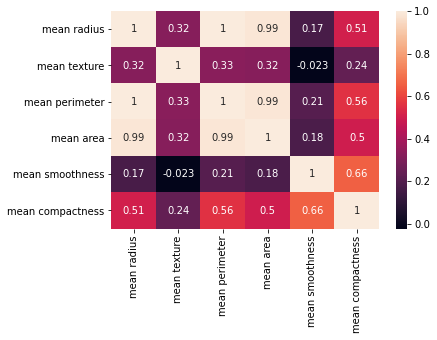

In [97]:
sns.heatmap(matrix_cor,annot = True)
plt.show()

### Pasar de una matriz a un vector
Es necesario usar la propiedad unstack

In [99]:
cor_values = matrix_cor.unstack()

#### Ordenar de mayor a menor

In [100]:
cor_values.sort_values(kind = 'quicksort')

mean texture      mean smoothness    -0.023389
mean smoothness   mean texture       -0.023389
mean radius       mean smoothness     0.170581
mean smoothness   mean radius         0.170581
mean area         mean smoothness     0.177028
mean smoothness   mean area           0.177028
                  mean perimeter      0.207278
mean perimeter    mean smoothness     0.207278
mean texture      mean compactness    0.236702
mean compactness  mean texture        0.236702
mean area         mean texture        0.321086
mean texture      mean area           0.321086
                  mean radius         0.323782
mean radius       mean texture        0.323782
mean texture      mean perimeter      0.329533
mean perimeter    mean texture        0.329533
mean compactness  mean area           0.498502
mean area         mean compactness    0.498502
mean compactness  mean radius         0.506124
mean radius       mean compactness    0.506124
mean perimeter    mean compactness    0.556936
mean compactn

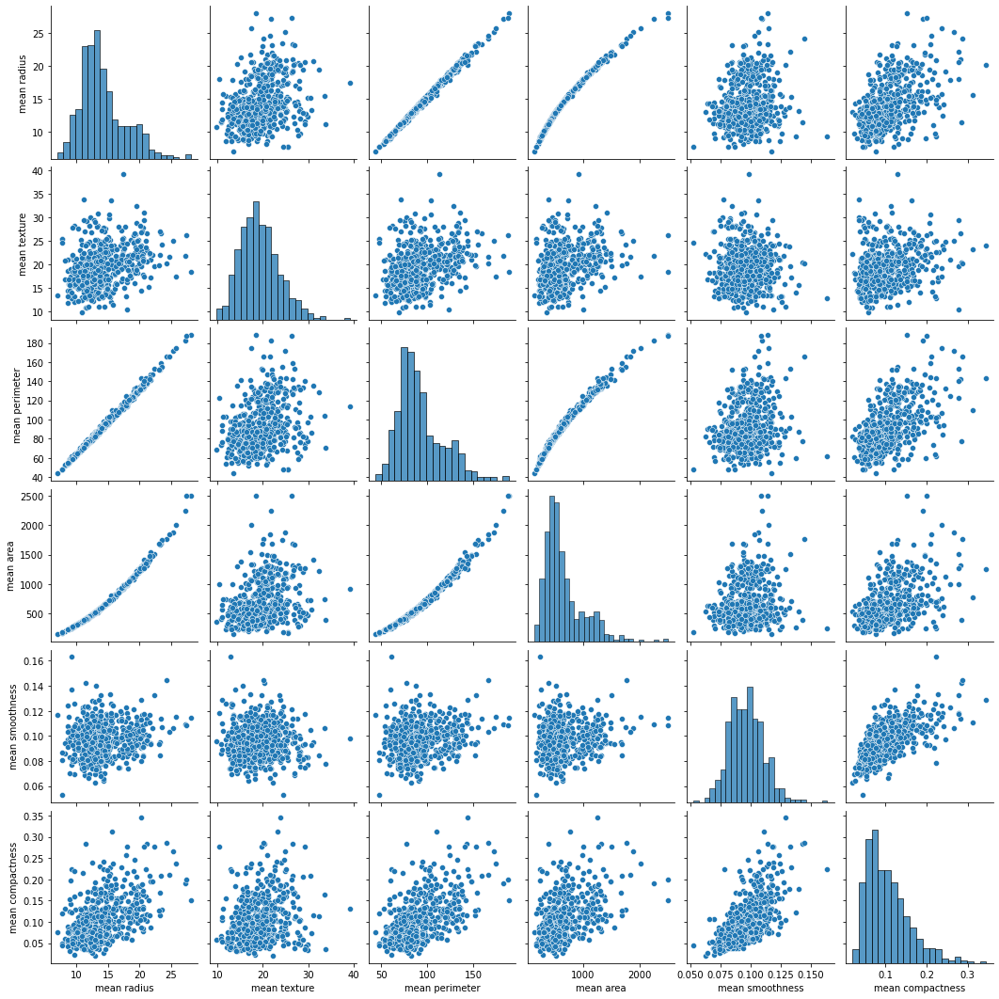

In [101]:
sns.pairplot(df_cancer_test)

In [102]:
df_titanic = pd.read_csv('train_titanic.csv')

In [106]:
df_titanic.shape

(891, 12)

In [109]:
df_titanic.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

## Análisis multivariable 
### Responder preguntas en la exploración de datos
#### ¿Afectará el sexo la supervivencia?
Revisar la tasa de supervivencia por sexo, para eso se saca un indice.

In [111]:
mujeres = df_titanic.loc[df_titanic.Sex=='female']['Survived']
tasa_mujeres = sum(mujeres)/len(mujeres)

In [112]:
tasa_mujeres

0.7420382165605095

In [113]:
hombre = df_titanic.loc[df_titanic.Sex=='male']['Survived']
tasa_hombre = sum(hombre)/len(hombre)

In [114]:
tasa_hombre

0.18890814558058924

In [116]:
df_titanic['name_survived']=df_titanic['Survived'].map({0:'No_survived',
                           1:'Survived'})

C:\Users\GAMER\anaconda3\envs\dataAnalyst\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



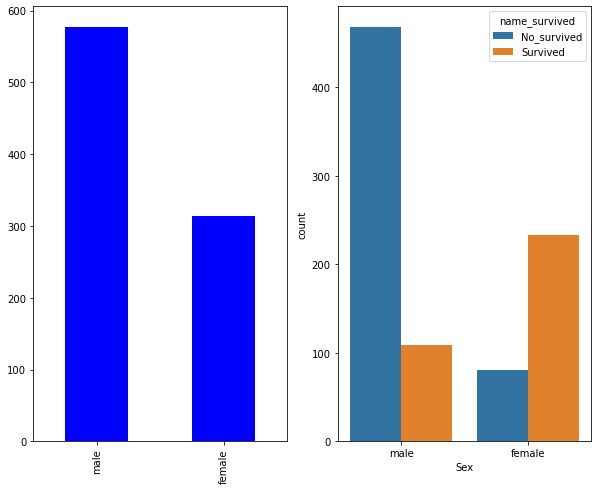

In [121]:
fig,ax = plt.subplots(1,2,figsize=(10,8))
df_titanic['Sex'].value_counts().plot.bar(color='blue',ax=ax[0])
## Contar por categorias
sns.countplot('Sex',hue='name_survived',data=df_titanic,ax=ax[1])
plt.show()

### Rangos de edad
#### ¿Cómo esta la distribución de los rangos de edad?
#### ¿El rango de edad afecta la tasa de supervivencia?

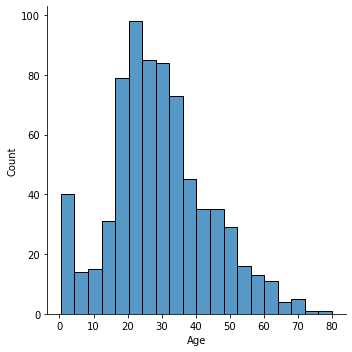

In [124]:
sns.displot(df_titanic['Age'].dropna())

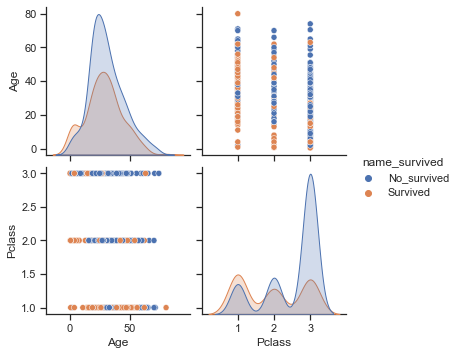

In [125]:
sns.set(style='ticks',color_codes='True')
sns.pairplot(df_titanic,vars=['Age','Pclass'],hue='name_survived')

#### Correlación
**Metodologia**
PERSSON: DE 0 A 1,
SPIRMAN: RANGO DE VALOR DE -1, 1 si los rangos de varian mucho es mejor la otra metodología

In [130]:
corr_t = df_titanic.corr(method='pearson')

<AxesSubplot:>

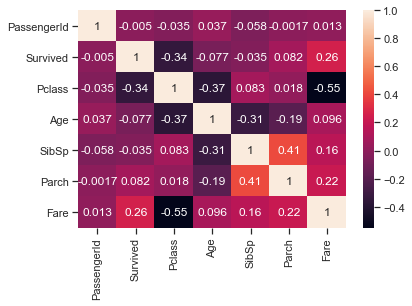

In [131]:
sns.heatmap(corr_t,annot=True)

### Paradoja de simpson
Cuando generalizamos los datos, perdemos caracteristicas especiales del conjunto de datos, es ahí donde se puede contrastar las variables para identificar el contexto del data set

### Correlación no implica causalidad
- Es necesario preguntarse si la correlación es causalidad 

In [133]:
import quandl

In [134]:
quandl.get('FRED/GDP')

,Value
Date,
1947-01-01,243.164
1947-04-01,245.968
1947-07-01,249.585
1947-10-01,259.745
1948-01-01,265.742
...,...
2020-07-01,21138.574
2020-10-01,21477.597
2021-01-01,22038.226


In [137]:
df_real = quandl.get('CHRIS/CME_GC1',column_index=6,collapse='weakly',start_date='2010-01-01')

In [138]:
df_real.resample('MS').ffill().dropna()

,Settle
Date,
2010-02-01,1104.3
2010-03-01,1118.3
2010-04-01,1125.1
2010-05-01,1180.7
2010-06-01,1224.8
...,...
2021-02-01,1866.0
2021-03-01,1725.8
2021-04-01,1728.4


### Ventana dinamica
Como agrupar los datos por tiempo

In [139]:
ventana_t = df_real.rolling(3)
media_df_real = ventana_t.mean()

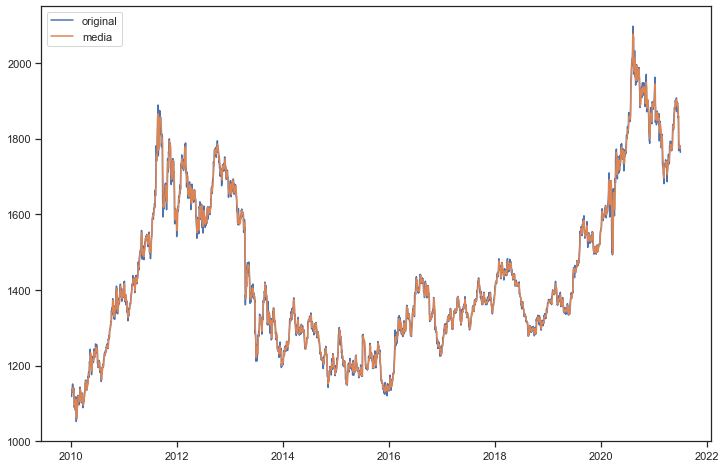

In [142]:
plt.figure(figsize=(12,8))
plt.plot(df_real,label='original')
plt.plot(media_df_real,label='media')
plt.legend()

In [143]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [146]:
season_variables= seasonal_decompose(df_real,period=12)

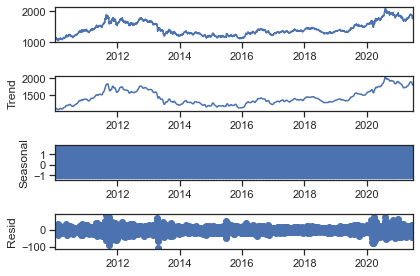

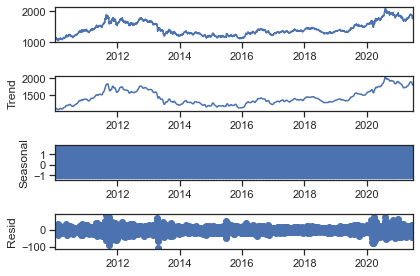

In [147]:
season_variables.plot()

In [148]:
df_power = pd.read_csv('df_power.csv')

In [150]:
df_power.columns

Index(['Unnamed: 0', 'Date', 'Consumption', 'Wind', 'Solar', 'Wind+Solar'], dtype='object')

In [152]:
df_power['Date'] = pd.to_datetime(df_power['Date'])

In [155]:
df_power.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4383 entries, 0 to 4382
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Unnamed: 0   4383 non-null   int64         
 1   Date         4383 non-null   datetime64[ns]
 2   Consumption  4383 non-null   float64       
 3   Wind         2920 non-null   float64       
 4   Solar        2188 non-null   float64       
 5   Wind+Solar   2187 non-null   float64       
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 205.6 KB


In [157]:
df_power.set_index('Date',inplace=True)

In [161]:
df_power['year'] = df_power.index.year

In [163]:
df_power['month'] = df_power.index.month

In [164]:
df_power['day'] = df_power.index.day_name()

<AxesSubplot:xlabel='Date'>

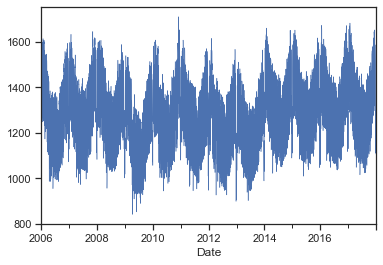

In [166]:
df_power['Consumption'].plot(linewidth=0.5)

### Comparar varias variables en TSA
para ello con matplotlib se debe colocar como argumento subplots True para que las variables que yo haya introducido en el metodo me las grafique de manera separada

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>], dtype=object)

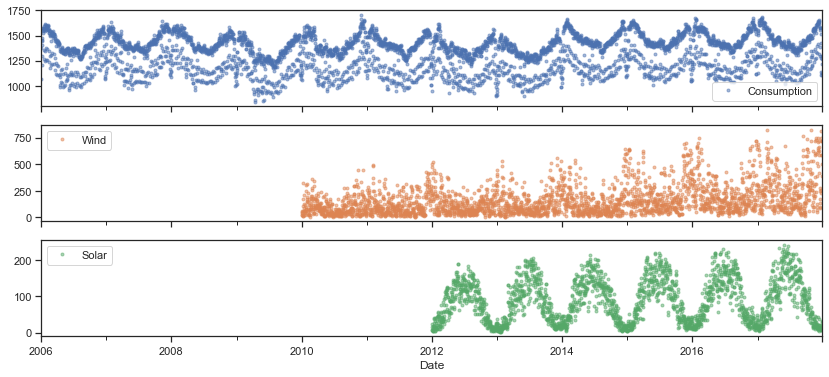

In [171]:
name = ['Consumption','Wind','Solar']
df_power[name].plot(marker='.',alpha=0.5,linestyle='None',figsize=(14,6),subplots=True)

<AxesSubplot:xlabel='Date'>

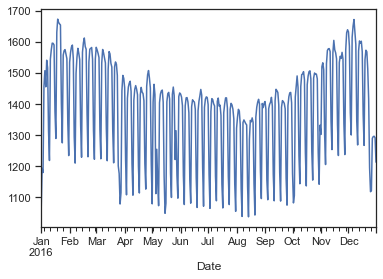

In [172]:
df_power.loc['2016','Consumption'].plot()

<AxesSubplot:xlabel='Date'>

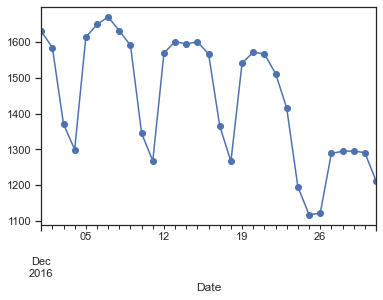

In [173]:
df_power.loc['2016-12','Consumption'].plot(marker='o')

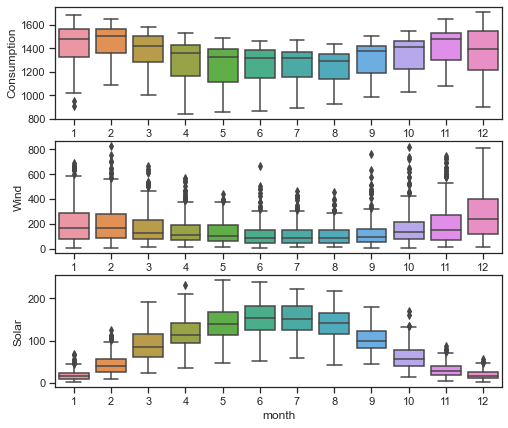

In [176]:
fig, axes = plt.subplots(3,1,figsize=(8,7))
for name, ax in zip(['Consumption','Wind','Solar'],axes):
    sns.boxplot(data=df_power,x='month',y=name,ax=ax)

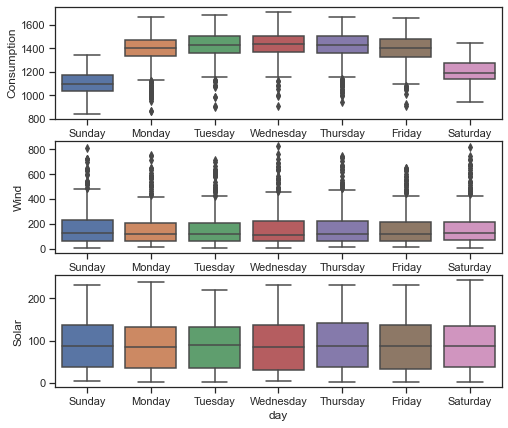

In [178]:
fig, axes = plt.subplots(3,1,figsize=(8,7))
for name, ax in zip(['Consumption','Wind','Solar'],axes):
    sns.boxplot(data=df_power,x='day',y=name,ax=ax)

### Evaluación de modelos 
#### Etapas del modelo

Pruebas de hipotesis o comprobación estadistica si una variable afecta algo o no Con:
- Anova,Z-test,T,test,Chi-squared test

Si no sabes la distribución se recomienda usar el chi-squared, ya si sabes la distribución especifica como la anova procedes a evaluar el resultado.

**p-value**: el nivel de significancia o de rechazo de la hipotesis ya que si cae dentro de ese nivel de significancia significa que es muy poco probable y se debe rechazar.


In [179]:
from sklearn import datasets

In [180]:
iris = datasets.load_iris()

In [183]:
data = pd.DataFrame(iris.data)
data.columns=iris.feature_names

In [185]:
data['target'] = iris.target

In [186]:
iris.target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

In [189]:
data['name_t'] = data['target'].map({0:'setosa',
                   1:'versicolor',
                   2:'virginica'})

In [190]:
data.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target,name_t
0,5.1,3.5,1.4,0.2,0,setosa
1,4.9,3.0,1.4,0.2,0,setosa
2,4.7,3.2,1.3,0.2,0,setosa
3,4.6,3.1,1.5,0.2,0,setosa
4,5.0,3.6,1.4,0.2,0,setosa


In [191]:
from sklearn.model_selection import train_test_split

In [192]:
target = ['target','name_t']
desc = list(set(list(data.columns)) - set(target))

In [195]:
X = data[desc].values
y = data['target'].values

In [196]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=40)

In [197]:
from sklearn.tree import DecisionTreeRegressor

In [198]:
reg_1 = DecisionTreeRegressor(max_depth=4)
reg_1.fit(X_train,y_train)

DecisionTreeRegressor(max_depth=4)

In [199]:
predict_train = reg_1.predict(X_train)
predict_test = reg_1.predict(X_test)

In [202]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


<AxesSubplot:>

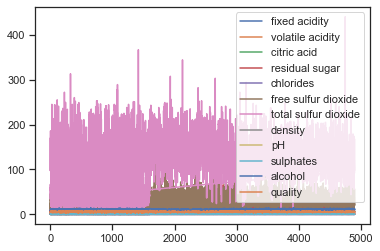

In [203]:
df.plot()

<AxesSubplot:>

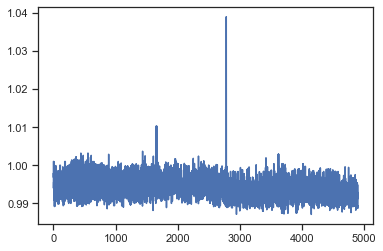

In [204]:
df['density'].plot()

C:\Users\GAMER\anaconda3\envs\dataAnalyst\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='quality', ylabel='count'>

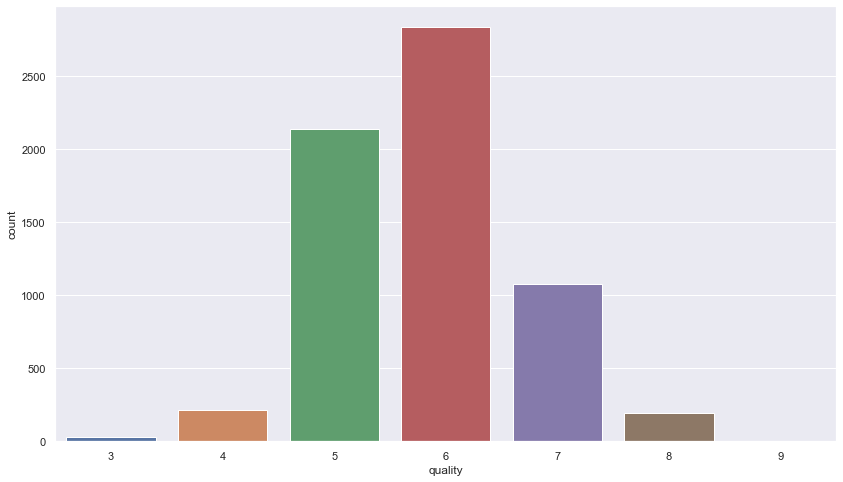

In [207]:
sns.set(rc={'figure.figsize':(14,8)})
sns.countplot(df['quality'])

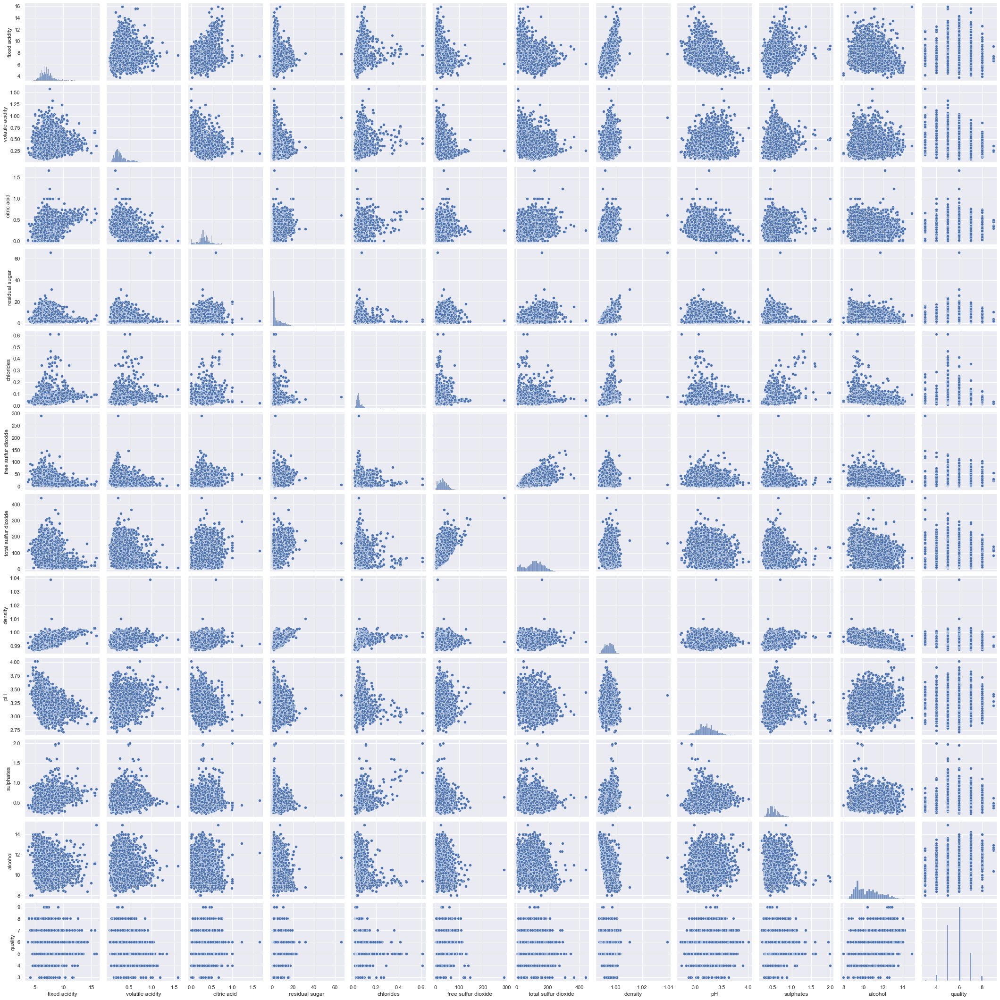

In [208]:
sns.pairplot(df)

<AxesSubplot:>

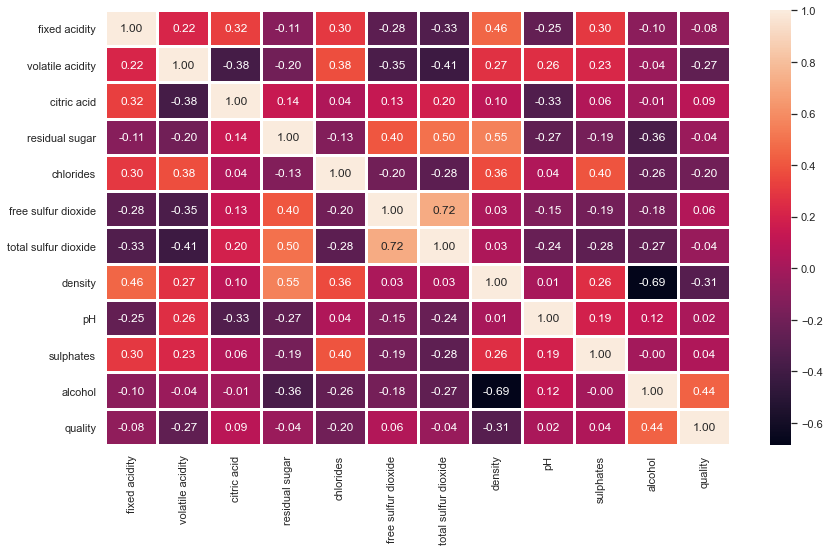

In [209]:
sns.heatmap(df.corr(),annot=True,fmt='.2f',linewidths=2)

C:\Users\GAMER\anaconda3\envs\dataAnalyst\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='alcohol', ylabel='Density'>

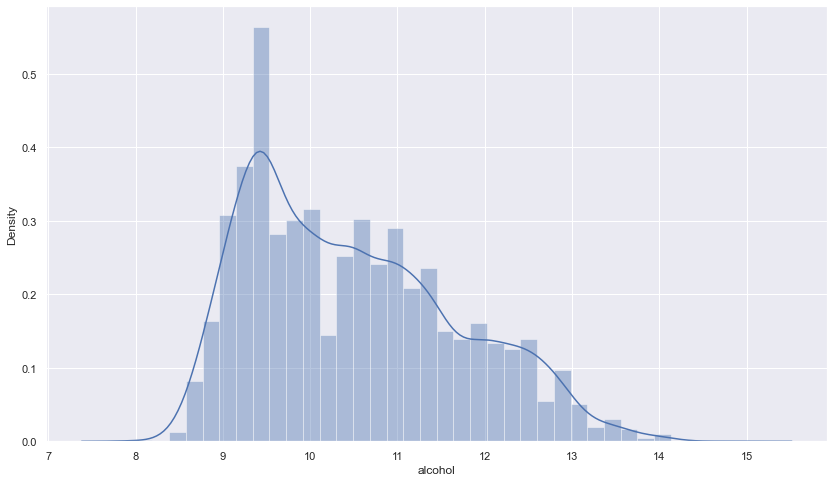

In [210]:
sns.distplot(df['alcohol'])

### Hacer categorias

In [211]:
from scipy.stats import skew
skew(df['alcohol'])

0.5655871101943124

<AxesSubplot:xlabel='quality', ylabel='alcohol'>

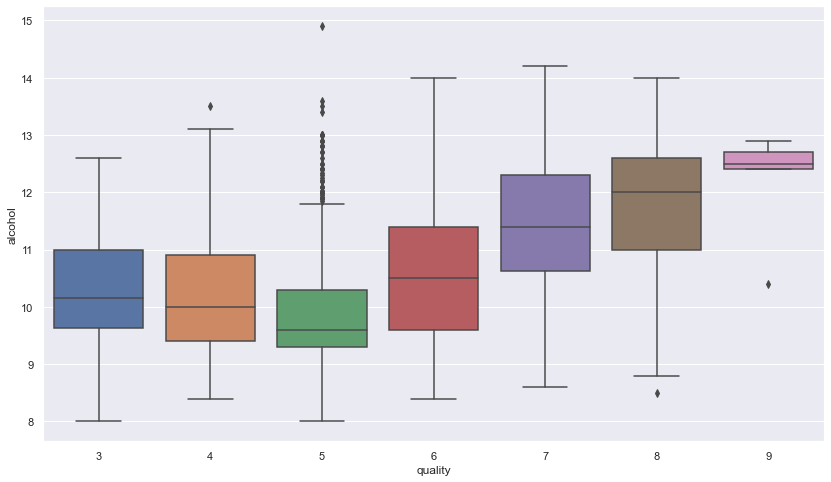

In [212]:
sns.boxplot(x='quality',y='alcohol',data=df)

In [215]:
df['quality_label'] = df['quality'].apply(lambda value: ('low' if value <= 5  else 'medium') if value <= 7 else 'high')
df['quality_label'] = pd.Categorical(df['quality_label'],categories=['low','medium','high'])

In [218]:
from mpl_toolkits.mplot3d import Axes3D

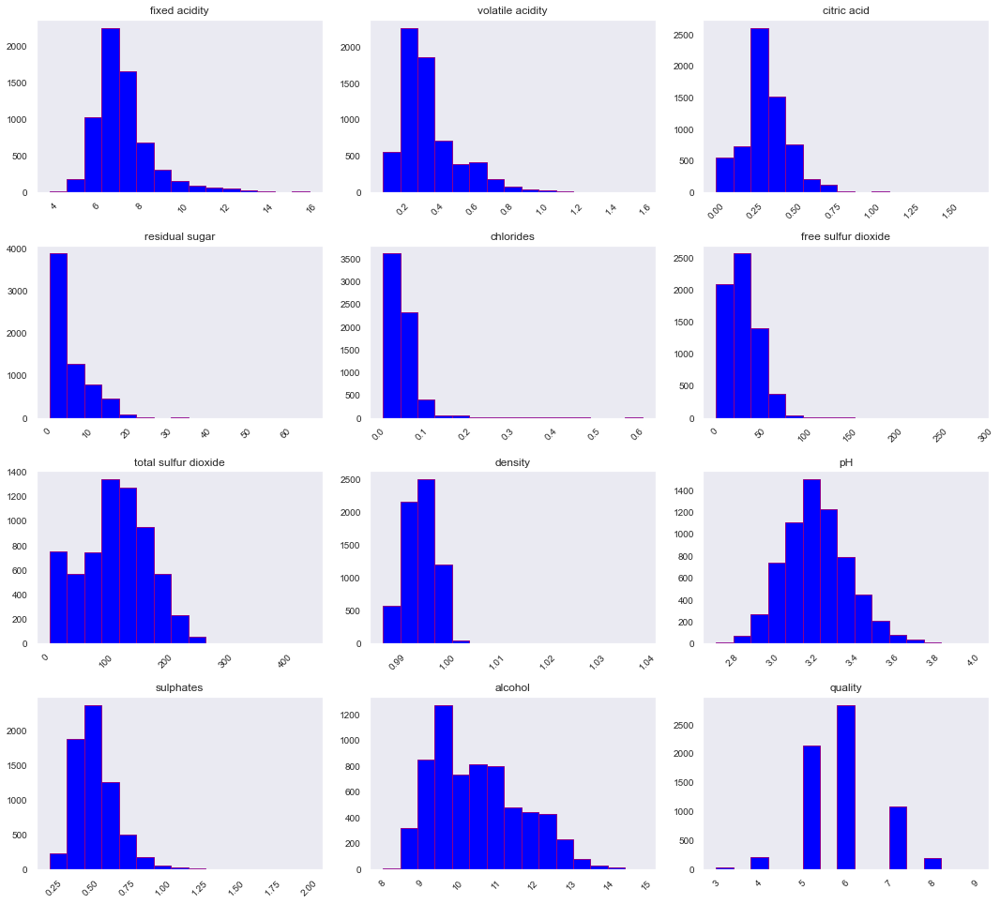

In [220]:
fig = df.hist(bins=15,color='blue',edgecolor='darkmagenta',linewidth=1.0,xlabelsize=10,ylabelsize=10,xrot=45,yrot=0,figsize=(10,9),grid=False)
plt.tight_layout(rect=(0,0,1.5,1.5))